****

<img src="https://raw.githubusercontent.com/JuliaLang/julia-logo-graphics/master/images/julia-logo-color.svg" height="100" />

***

<center><i>student name: <a href="//github.com/ZhouZhuofei">ZhouZhuoFei</a></i></center>

****

we take a matrix A here:

$$
\begin{equation*}
A = 
\begin{bmatrix}
2 & 1 & 3 \\
3 & 1 & 4 \\
5 & 7 & 12
\end{bmatrix}
\end{equation*}
$$
 
Calculate $Ax$, there are two ways to do:

1. dot products of $rows \cdot x$(low levels)
2. use columnss to times x

_**for example**_:

use dot products:

$$
\begin{equation*}
Ax = 
\begin{bmatrix}
2x_1+x_2+3x_3  \\
3x_1+x_2+4_x3 \\
5x_1+7x_2+12x_3 
\end{bmatrix}
\end{equation*}
$$

use cols:

$$
\begin{equation*}
Ax = x_1
\begin{bmatrix}
2  \\
3 \\
5 
\end{bmatrix} +x_2\begin{bmatrix}
1 \\
1 \\
7 
\end{bmatrix} + x_3\begin{bmatrix}
3  \\
4 \\
12 
\end{bmatrix}
\end{equation*}
$$

All Ax gives us cloumn space = C(A).

we find the column one add column two equal to column three. Rank(A) = 2, so C(A) = plane.

In [1]:
using PlotlyJS, DataFrames, RDatasets, Colors, Distributions, LinearAlgebra

HTML{String}("<script>\n// Immediately-invoked-function-expression to avoid global variables.\n(function() {\n    var warning_div = document.getElementById(\"webio-warning-9856781565201835120\");\n    var hide = function () {\n        var script = document.getElementById(\"webio-setup-4649429543413298815\");\n        var parent = script && script.parentElement;\n        var grandparent = parent && parent.parentElement;\n        if (grandparent) {\n            grandparent.style.display = \"none\";\n        }\n        warning_div.style.display = \"none\";\n    };\n    if (typeof Jupyter !== \"undefined\") {\n        console.log(\"WebIO detected Jupyter notebook environment.\");\n        // Jupyter notebook.\n        var extensions = (\n            Jupyter\n            && Jupyter.notebook.config.data\n            && Jupyter.notebook.config.data.load_extensions\n        );\n        if (extensions && extensions[\"webio-jupyter-notebook\"]) {\n            // Extension already loaded.\n            console.log(\"Jupyter WebIO nbextension detected; not loading ad-hoc.\");\n            hide();\n            return;\n        }\n    } else if (window.location.pathname.includes(\"/lab\")) {\n        // Guessing JupyterLa\n        console.log(\"Jupyter Lab detected; make sure the @webio/jupyter-lab-provider labextension is installed.\");\n        hide();\n        return;\n    }\n})();\n\n</script>\n<p\n    id=\"webio-warning-9856781565201835120\"\n    class=\"output_text output_stderr\"\n    style=\"padding: 1em; font-weight: bold;\"\n>\n    Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n    For troubleshooting, please see <a href=\"https://juliagizmos.github.io/WebIO.jl/latest/providers/ijulia/\">\n    the WebIO/IJulia documentation</a>.\n    <!-- TODO: link to installation docs. -->\n</p>\n")

In [66]:
function rand_point_3d(rw)
    trace = scatter3d(;x=rw[1,:],y=rw[2,:], z=rw[3,:], mode="markers",
                        marker=attr(color="#1f77b4", size=1, symbol="circle",
                                    line=attr(color="rgb(0,0,0)", width=0)),
                        line=attr(color="#1f77b4", width=1))
    cluster = mesh3d(;opacity=0.3, x=rw[1,:], y=rw[2,:], z=rw[3,:])
    layout = Layout(autosize=false, width=950, height=600,
                    margin=attr(l=0, r=0, b=0, t=65))
    plot([trace, cluster], layout)
end;
    

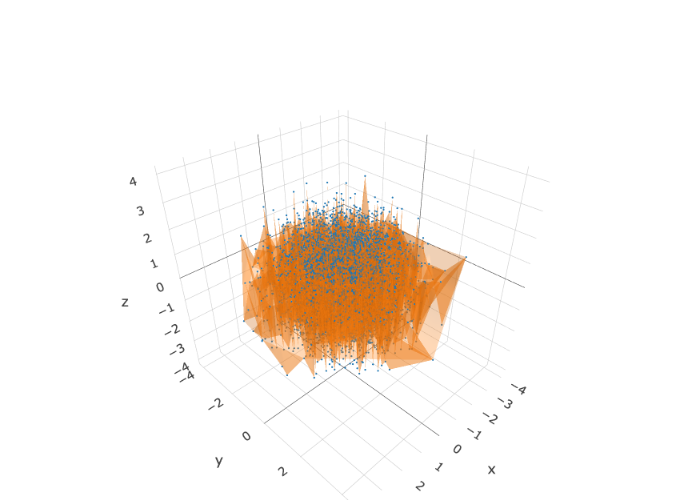

In [67]:
rand_point_3d(randn(3,10000))

 if we define x is $(x_1, x_2, x_3)$ where x is a random number. then we plot the 3D scatter like that.
 
 So after we do a calculate $Ax$, the figure will like that:

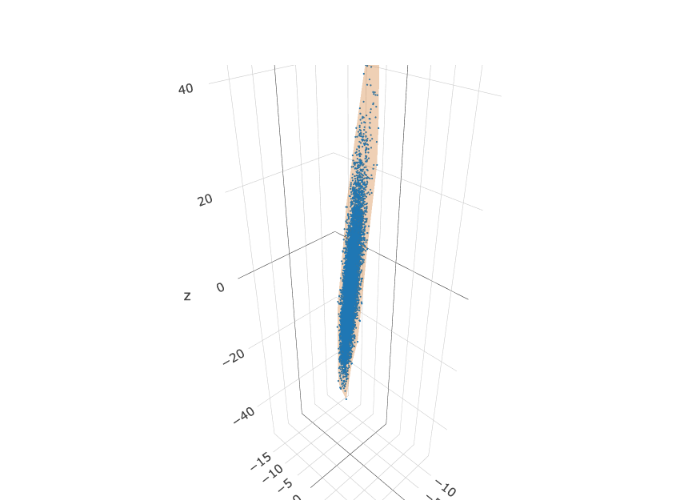

In [68]:
x = randn(3, 10000)
A = [[2, 3, 5] [1, 1, 7] [3, 4, 12]]
B = [[1,1,1] [3,3,3] [8,8,8]]
res = A*x
rand_point_3d(res)

As you see, $Ax$ make the points to form a plane.

so let's choose other matrix to show the plane.

$$
\begin{equation*}
B = 
\begin{bmatrix}
1 & 3 & 8 \\
1 & 3 & 8 \\
1 & 3 & 8
\end{bmatrix}
\end{equation*}
$$

if we do $Bx$.

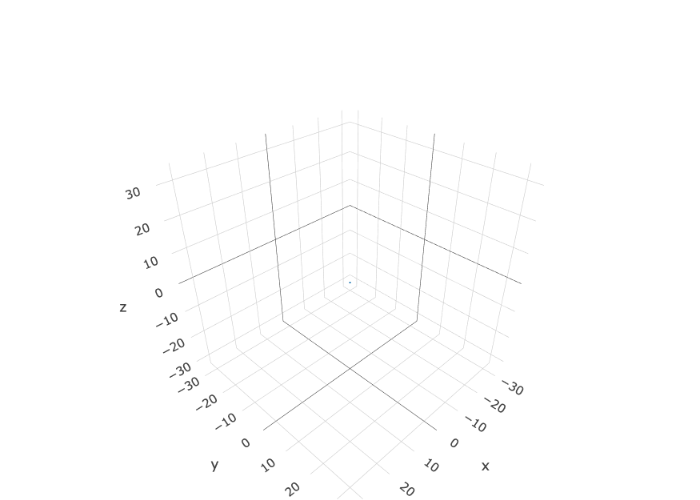

In [69]:
res1 = B*x
rand_point_3d(res1)

we find the B can be write:

$$
\begin{equation*}
B = 
\begin{bmatrix}
1 & 3 & 8 \\
1 & 3 & 8 \\
1 & 3 & 8
\end{bmatrix} = \begin{bmatrix}
1  \\
1  \\
1 
\end{bmatrix}\begin{bmatrix}
1 & 3 & 8 \\
\end{bmatrix} = uv^T
\end{equation*}
$$

$Rank(B) = 1$

the Column space of B is a line. any x to do $Bx$ will get a point in a line, like above.

back to look a $A$:

$$
\begin{equation*}
A = 
\begin{bmatrix}
2 & 1 & 3 \\
3 & 1 & 4 \\
5 & 7 & 12
\end{bmatrix} = \begin{bmatrix}
2 &1  \\
3 &1  \\
5 &7 
\end{bmatrix}\begin{bmatrix}
1 & 0 & 1 \\
0 & 1 & 1
\end{bmatrix} = uv^T
\end{equation*}
$$

Column space of $A$ = $C(A)$

The basic of $C(A)$ is :

$$
\begin{equation*}
u=
\begin{bmatrix}
2 &1  \\
3 &1  \\
5 &7 
\end{bmatrix}
\end{equation*}
$$

row space of A = $C(A^T)$, the basic is:
$$
\begin{equation*}
v=
\begin{bmatrix}
1 & 0 & 1 \\
0 & 1 & 1
\end{bmatrix}
\end{equation*}
$$

A matrix $A$ can be write as $A=CR$

$Ax$ in column spcae, where $x$ in $rand(m,1)$, also $ABCx$ in column spcae.($ABCx=A(BCx)$)

If $A,B$ are matrixs. calculate $A \cdot B$ :

1. dot product
2. $col \cdot row$

For 2: $AB = \sum col_k row_k$, for $col_k$ in $A$, $row_k$ in $B$

## Problems for Lecture 1 (from textbook Section I.1)

1. Give an example where a combination of three nonzero vectors in $R^4$ is the zero vector. Then write your example in the form $Ax=0$, what are the shapes of $A$ and $x$ and $0$

In [81]:
A1 = [[-1, -1, 2, -2] [-1, 2, 1, 1] [2, -1, -3, 1] [0, 0, 0, 0]]

4×4 Array{Int64,2}:
 -1  -1   2  0
 -1   2  -1  0
  2   1  -3  0
 -2   1   1  0

In [84]:
A1*[1,1,1,0]

4-element Array{Int64,1}:
 0
 0
 0
 0

4. Suppose $A$ is the 3 by 3 matrix ones(3, 3) of all ones. Find two independent vectors $x$ and $y$ that solve $Ax=0$ and $Ay=0$. Write that first equation $Ax=0$ (with numbers) as a combination of the columns of $A$. Why don’t I ask for a third independent vector with $Az = 0$ 

In [91]:
A4 = ones(3,3)
x = [0,1,-1]
y = [0,-1,1]
rank(A4)

1